# Trabajo hecho por Iván y Paloma

In [ ]:
from google.colab import drive

drive.mount('/content/drive')

Mounted at /content/drive


Importamos las librerías requeridas para el preprocesamiento de imágenes:

In [ ]:
import os
import numpy as np
from matplotlib import pyplot as plt
import cv2
from google.colab.patches import cv2_imshow

# Cebra

## Coloreando las rayas negras de la cebra

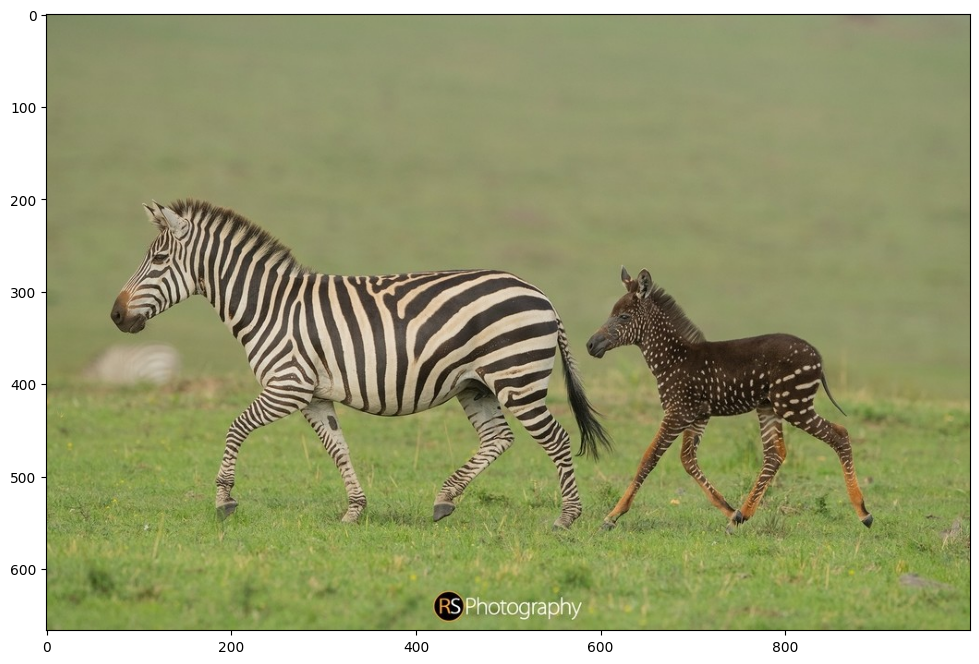

In [ ]:
# Definimos las rutas necesarias para cargar la imagen desde google drive

# BASE = '/content/drive/MyDrive/Imagenes' # Paloma

# Cargamos la imagen con la librería cv2
zebra = cv2.imread(os.path.join(BASE, 'zebra.jpg'))

# Antes de mostrar la imagen la convertimos a RGB
zebra = cv2.cvtColor(zebra, cv2.COLOR_BGR2RGB)

# Mostramos por pantalla con matplotlib la imagen
plt.figure(figsize=(16,8))
plt.imshow(zebra)
plt.show()

In [ ]:
# Comprobamos la forma/estructura de la foto (filas, columnas, canales)
zebra.shape

(667, 1000, 3)

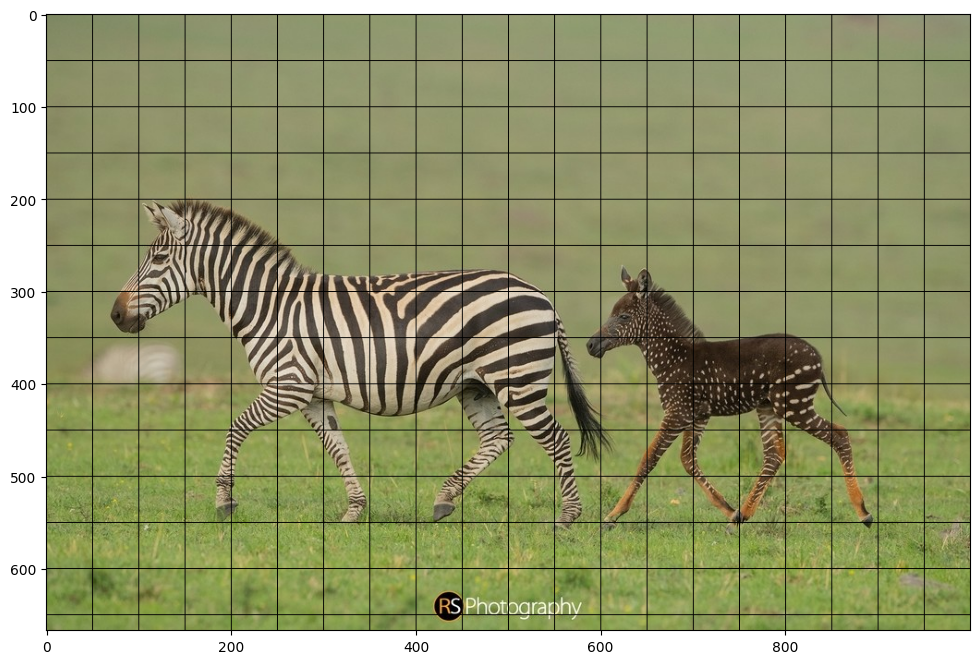

In [ ]:
# Hacemos una copia de la imagen y pintamos cuadrados de 50x50 píxeles para recortar el fondo
gridZebra = zebra.copy();

for i in range(0,gridZebra.shape[0],50):
    gridZebra[i,:]=0;

for i in range(0,gridZebra.shape[1],50):
    gridZebra[:,i]=0;

plt.figure(figsize=(16,8))
plt.imshow(gridZebra)
plt.show()

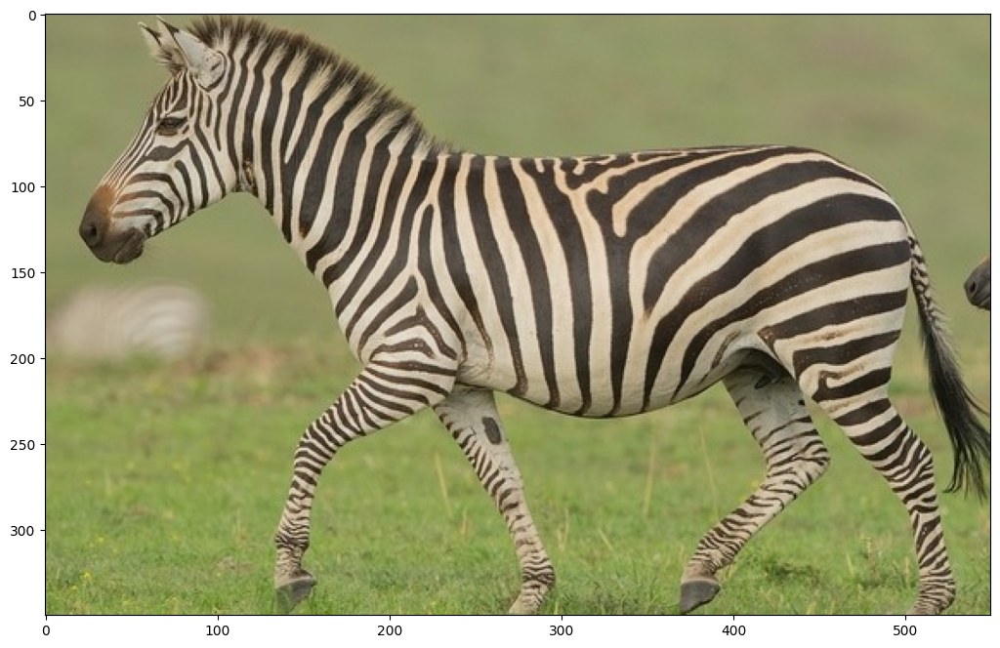

In [ ]:
# Recortamos las filas y columnas de píxeles de la cebra que sobran
zebra = zebra[200:550, 50:600];
plt.figure(figsize=(16,8))
plt.imshow(zebra)
plt.show()

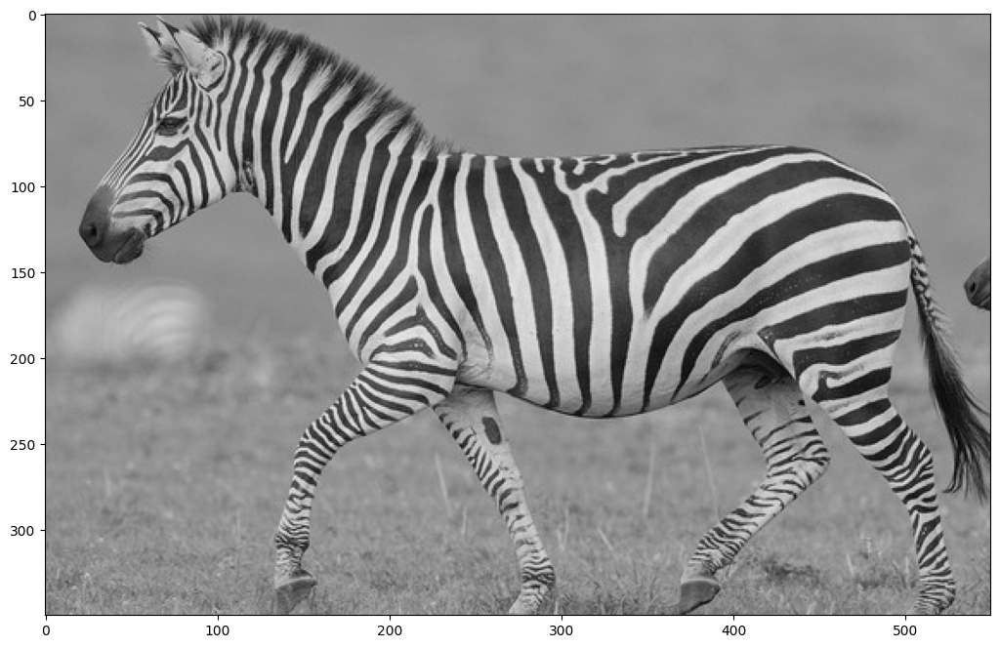

In [ ]:
# Convertimos la imagen a escala de grises
grayZebra = cv2.cvtColor(zebra, cv2.COLOR_RGB2GRAY)
plt.figure(figsize=(16,8))
plt.imshow(grayZebra, cmap='gray')
plt.show()

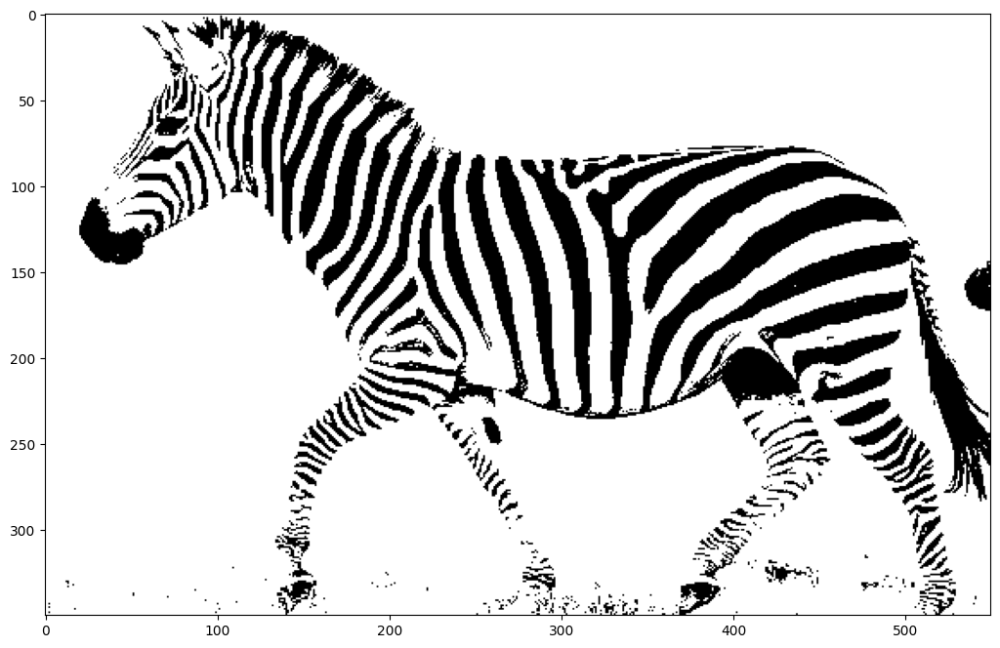

In [ ]:
# Con esto indicamos un umbral para detectar los píxeles negros y los que esten por debajo del umbral los pintamos de negro y los que se encuentran en el umbral en blanco con
# cv2.THRESH_BINARY
ret, threshZebra = cv2.threshold(grayZebra, 100, 255, cv2.THRESH_BINARY)
plt.figure(figsize=(16,8))
plt.imshow(threshZebra, cmap='gray')
plt.show()

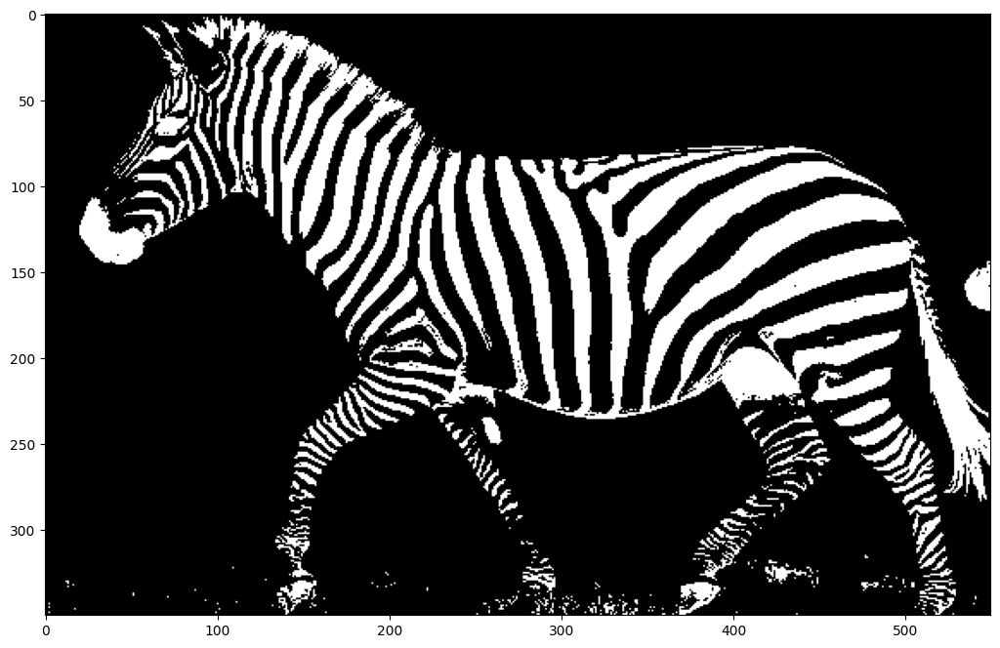

In [ ]:
# Creamos una máscara invertida con lo que si un píxel tiene un valor de 0, el resultado será 255, y si un píxel tiene un valor de 255, el resultado será 0.
maskInv = cv2.bitwise_not(threshZebra)
plt.figure(figsize=(16,8))
plt.imshow(maskInv, cmap='gray')
plt.show()

In [ ]:
# Volvemos a convertir la imagen para que tenga 3 canales y no solamente 1 creando una matriz con la forma de la imagen original de cebra con valores de blanco
whiteBackground = np.full(zebra.shape, (255, 165, 0), dtype=np.uint8)

In [ ]:
whiteBackground.shape

(350, 550, 3)

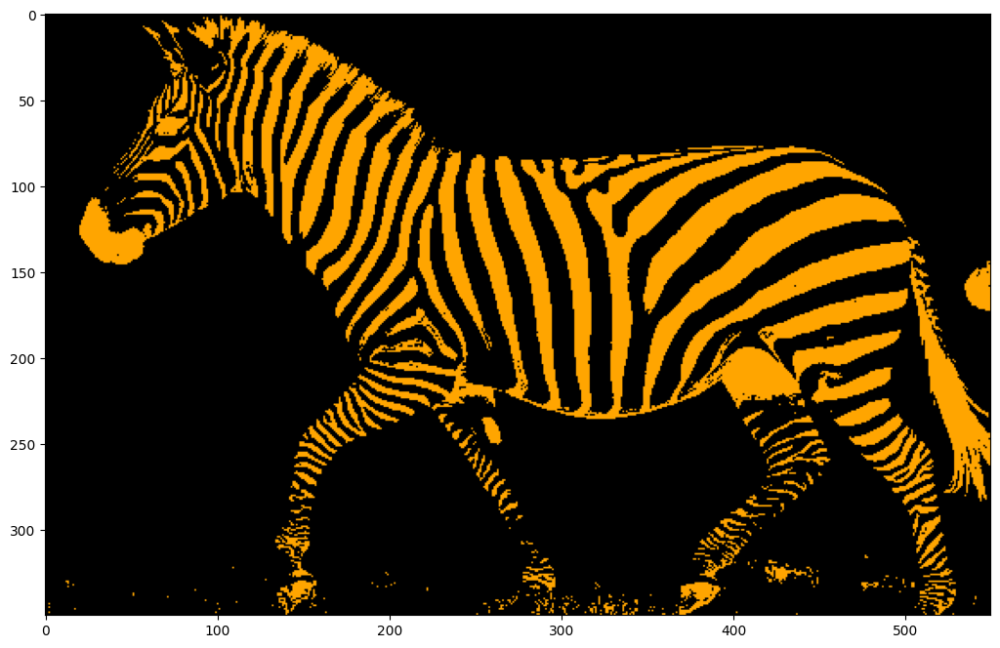

In [ ]:
# Aplicamos bitwise_or para que sobre la imagen en blanco que creamos antes solo se pinten de blanco los que cumplan con la mascara inversa que creamos
bk = cv2.bitwise_or(whiteBackground, whiteBackground, mask=maskInv)
plt.figure(figsize=(16,8))
plt.imshow(bk, cmap='gray')
plt.show()

In [ ]:
bk.shape

(350, 550, 3)

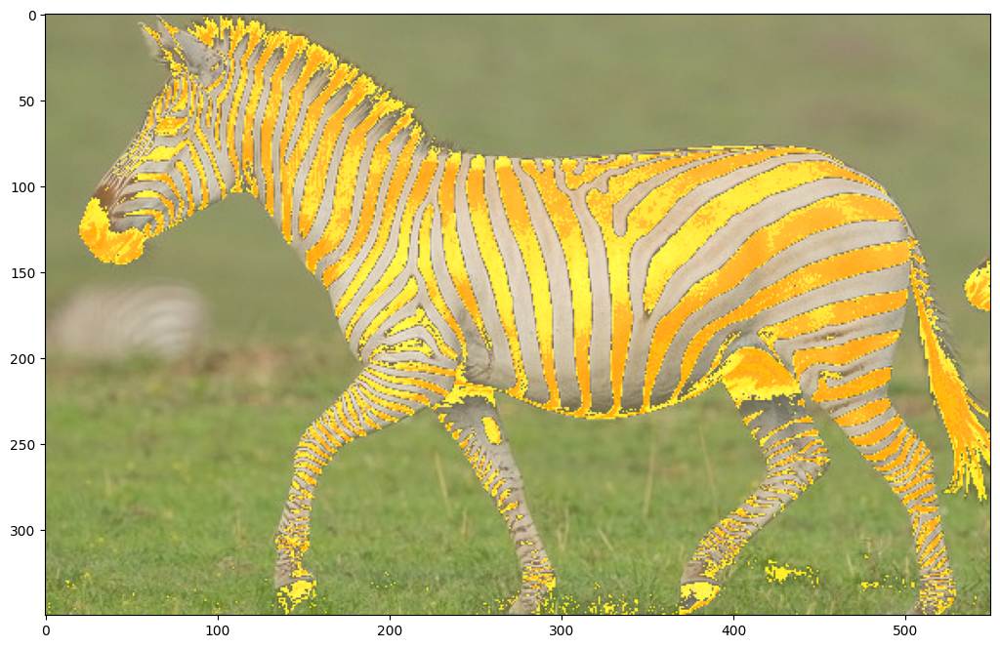

In [ ]:
# Utilizando cv2.bitwise_or combinamos las 2 imágenes siempre que no se cumpla la condición de que el píxel no sea 0 en bk pinta en la imagen original la raya de naranja
orangeZebra = cv2.bitwise_or(zebra,bk)
plt.figure(figsize=(16,8))
plt.imshow(orangeZebra)
plt.show()

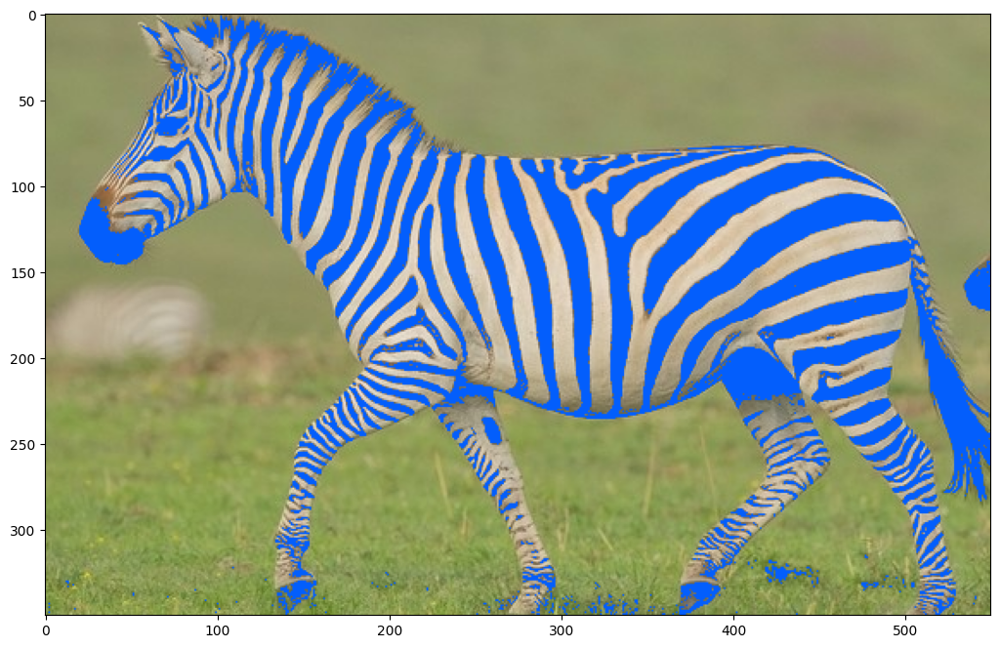

In [ ]:
# Otra forma de hacer lo anterior más directo sería recorriendo pixel a pixel y cambiándolo al color que queramos si en esa posición de la imagen en blanco y negro con los
# threshold es negro
# Hacemos una copia de la imagen antes de modificarla
cebra_copy = zebra.copy();
# Recorremos los píxeles de la imagen si el pixel es negro lo cambiamos a azul
cebraRGB = cv2.cvtColor(threshZebra, cv2.COLOR_GRAY2RGB)
for i in range(len(cebraRGB)):
    for j, pixel in enumerate(cebraRGB[i]):
        # Verifica si el píxel es negro
        if np.all(pixel == [0, 0, 0]):
            # Cambia el píxel a azul
            cebra_copy[i, j] = (3, 94, 252)
plt.figure(figsize=(16,8))
plt.imshow(cebra_copy)
plt.show()

## Quitando las rayas negras de la cebra

In [ ]:
# Creamos la imagen de máscara usando un umbral adaptativo
thresh = cv2.adaptiveThreshold(threshZebra, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY_INV, 17, 4)

La técnica *inpainting* elimina ruido de la imagen reemplazando los "trazos malos"(que en esta imagen se corresponden con las rayas negras) por sus pixels vecinos, de forma que se asemeja al conjunto de pixels vecinos. La eliminación de ruido se consigue mediante la solución de las ecuaciones de Navier-Stokes que modelan el comportamiento del fluido en la imagen.


In [ ]:
# Aplicamos inpainting usando el algoritmo NS
dst = cv2.inpaint(zebra, thresh, 3, cv2.INPAINT_NS)

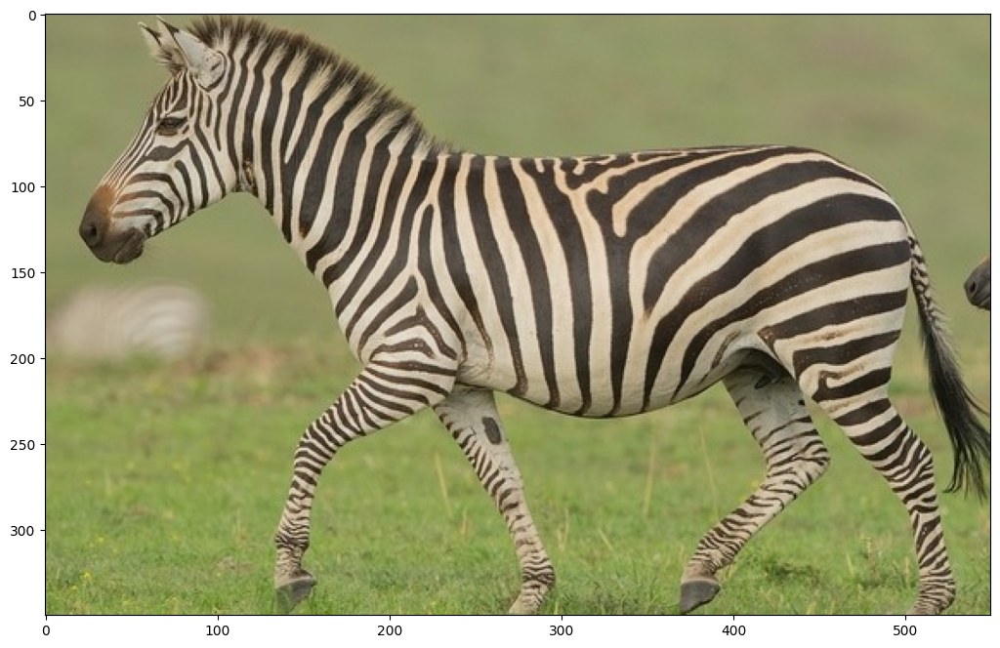

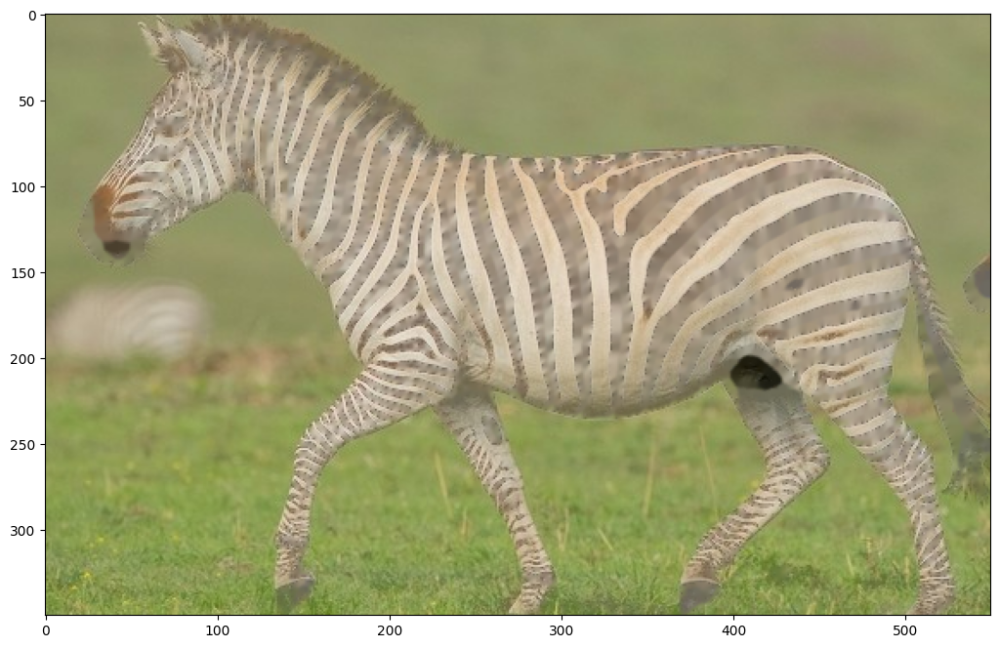

In [ ]:
# Mostramos la comparativa de las 2 imágenes
plt.figure(figsize=(16,8))
plt.imshow(zebra)
plt.show()

plt.figure(figsize=(16,8))
plt.imshow(dst)
plt.show()

# Tigre

## Coloreando las rayas negras del tigre

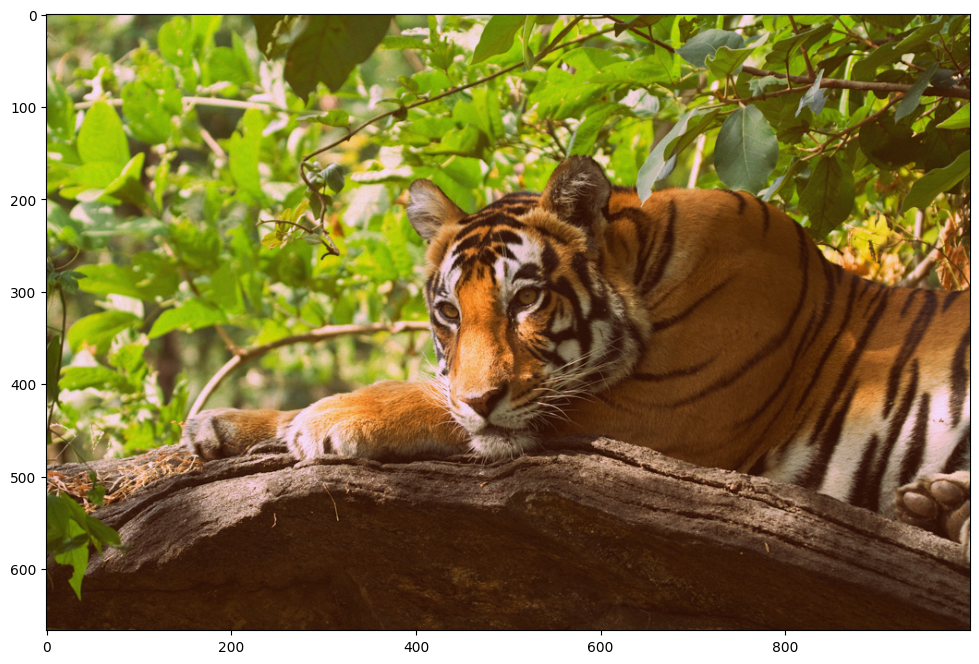

In [ ]:
# Cargamos la imagen con la librería cv2
tiger = cv2.imread(os.path.join(BASE, 'tigre_bengala2.jpg'))

# Antes de mostrar la imagen la convertimos a RGB
tiger = cv2.cvtColor(tiger, cv2.COLOR_BGR2RGB)

# Mostramos por pantalla con matplotlib la imagen
plt.figure(figsize=(16,8))
plt.imshow(tiger)
plt.show()

In [ ]:
# Comprobamos la forma/estructura de la foto (filas, columnas, canales)
tiger.shape

(667, 1000, 3)

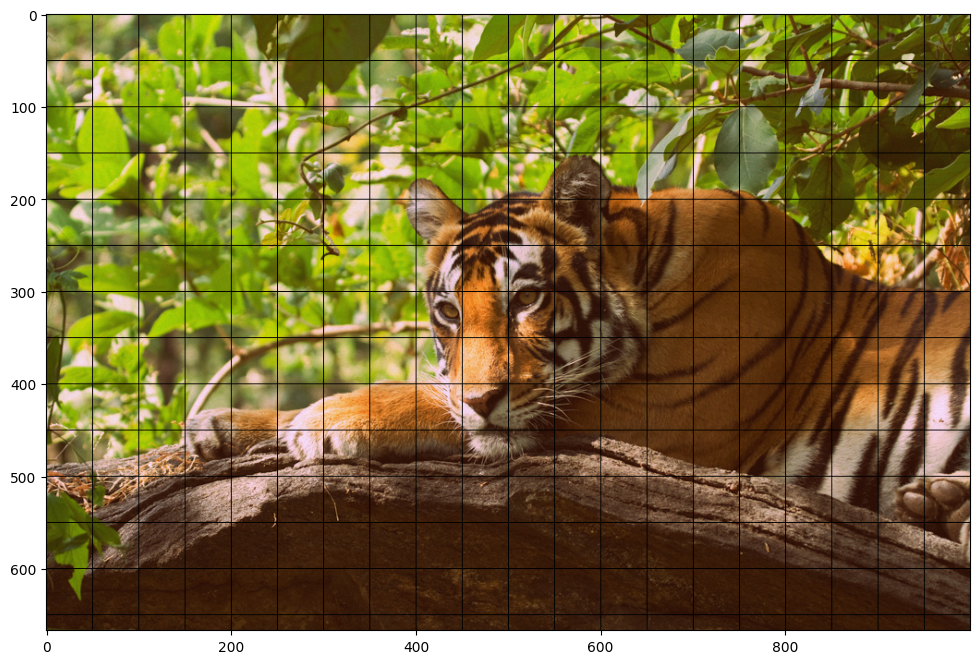

In [ ]:
# Hacemos una copia de la imagen y pintamos cuadrados de 50x50 píxeles para recortar el fondo
gridTiger = tiger.copy();

for i in range(0,gridTiger.shape[0],50):
    gridTiger[i,:]=0;

for i in range(0,gridTiger.shape[1],50):
    gridTiger[:,i]=0;

plt.figure(figsize=(16,8))
plt.imshow(gridTiger)
plt.show()

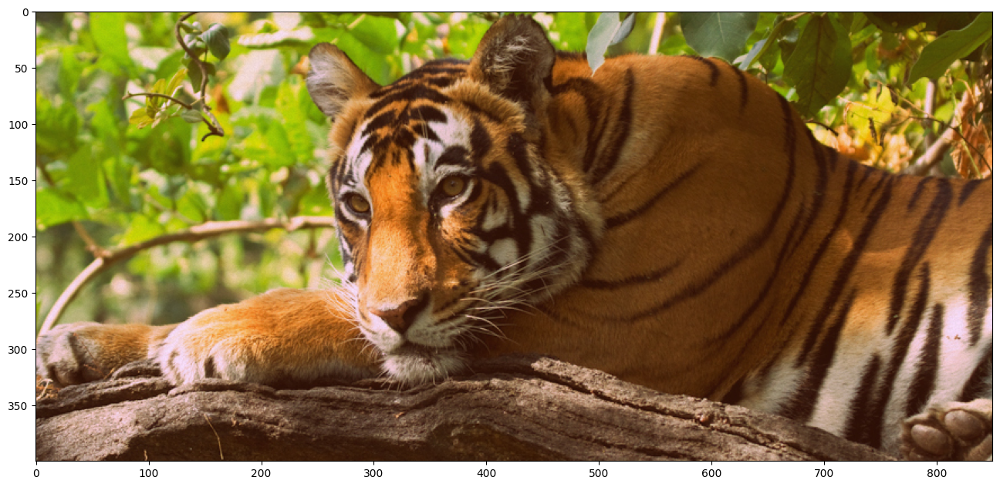

In [ ]:
# Recortamos las filas y columnas de píxeles del tigre que sobran
tiger = tiger[150:550, 150:];
plt.figure(figsize=(16,8))
plt.imshow(tiger)
plt.show()

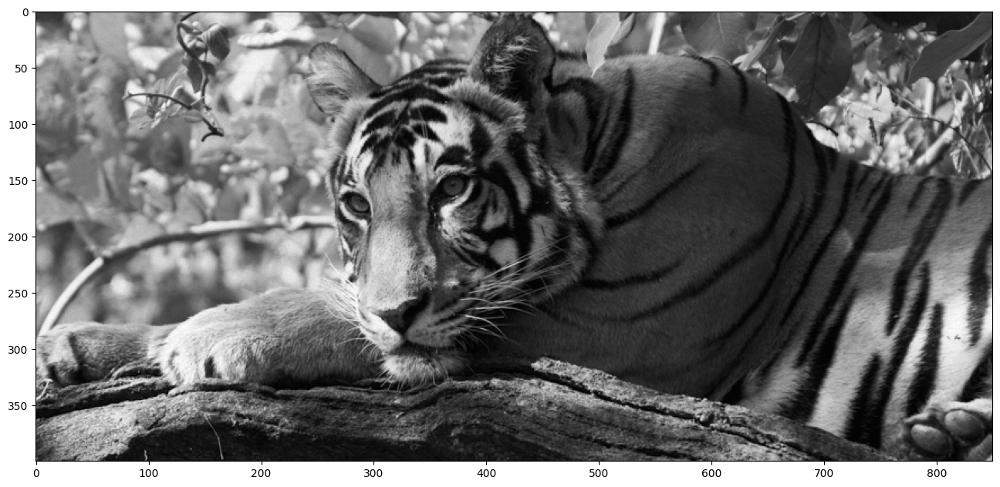

In [ ]:
# Convertimos la imagen a escala de grises
grayTiger = cv2.cvtColor(tiger, cv2.COLOR_RGB2GRAY)
plt.figure(figsize=(16,8))
plt.imshow(grayTiger, cmap='gray')
plt.show()

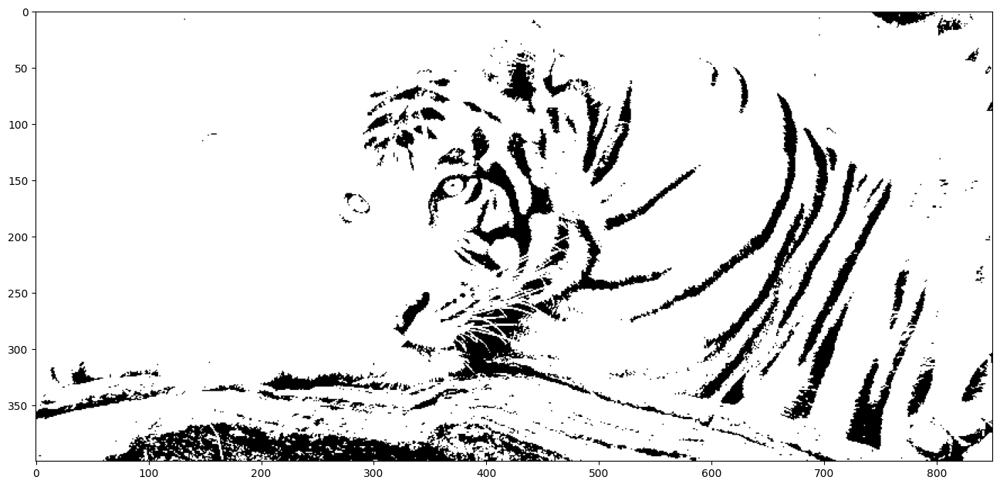

In [ ]:
# Con esto indicamos un umbral para detectar los píxeles negros y los que esten por debajo del umbral los pintamos de negro y los que se encuentran en el umbral en blanco con
# cv2.THRESH_BINARY
ret, threshTiger = cv2.threshold(grayTiger, 40, 255, cv2.THRESH_BINARY)
plt.figure(figsize=(16,8))
plt.imshow(threshTiger, cmap='gray')
plt.show()

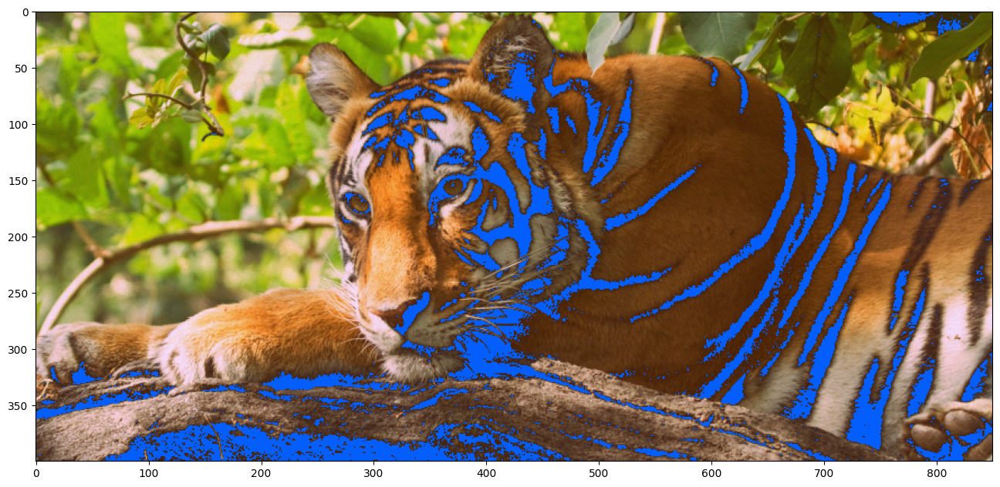

In [ ]:
# Hacemos una copia de la imagen antes de modificarla
tiger_copy = tiger.copy();
# Recorremos los píxeles de la imagen si el pixel es negro lo cambiamos a azul
tigerRGB = cv2.cvtColor(threshTiger, cv2.COLOR_GRAY2RGB)
for i in range(len(tigerRGB)):
    for j, pixel in enumerate(tigerRGB[i]):
        # Verifica si el píxel es negro
        if np.all(pixel == [0, 0, 0]):
            # Cambia el píxel a azul
            tiger_copy[i, j] = (3, 94, 252)
plt.figure(figsize=(16,8))
plt.imshow(tiger_copy)
plt.show()